# Batch correction test in Harmony

In [1]:
# Load packages
suppressPackageStartupMessages({
    library(ggplot2)
    library(biomaRt)
    library(BiocParallel)
    library(Matrix)
    library(matrixStats)
    library(scater)
    library(reshape2)
    library(knitr)
    library(scran)
    library(reticulate)
    library(igraph)
    library(gridExtra)
    library(irlba)
    library(viridis)
})
    ncores = 4
    mcparam = MulticoreParam(workers = ncores)
    register(mcparam)

options(repr.plot.width=15, repr.plot.height=8)

In [2]:
main = "/rds/project/rds-SDzz0CATGms/users/bt392/01_Eomes_RNA/"
out_dir = paste0(main, '06_batch_correct/')
dir.create(out_dir, showWarnings = FALSE)

source(paste0(main, "mapping_functions.R"))
load_data(remove_doublets = TRUE, remove_stripped = TRUE)
meta$batch = as.factor(meta$batch)

In [3]:
head(meta)
head(colnames(sce))

,cell,barcode,stage,batch,Sample_name,batch_name,tdTom,index,sample,doub.density,doublet,stripped
,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<lgl>,<lgl>
1,cell_1,AAACCCAGTTCTCTAT,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,1,3,13.9251218125,FALSE,FALSE
2,cell_2,AAACGCTAGTGATTCC,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,2,3,17.2720353798127,FALSE,FALSE
3,cell_3,AAACGCTCATGACTCA,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,3,3,10.7818835555556,FALSE,FALSE
4,cell_4,AAAGGGCAGTCATGAA,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,4,3,11.1007909421488,FALSE,FALSE
6,cell_6,AAAGTGAAGTGTAGAT,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,6,3,16.5111062820227,FALSE,FALSE
7,cell_7,AACAACCTCCTTATAC,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,7,3,0,FALSE,FALSE


[1] "cell_1" "cell_2" "cell_3" "cell_4" "cell_6" "cell_7"

In [4]:
# Running UMAP from python
source_python(paste0(main, 'UMAP_R_to_py.py'))
run_umap = function(pca_in){
    umap = as.data.frame(umap_redu(pca_in))
    colnames(umap) = c('umap_1', 'umap_2')
    rownames(umap) = meta$cell
    return(umap)    
}

In [5]:
hvgs = getHVGs(sce, block=meta$sample)
pca = prcomp_irlba(t(logcounts(sce[hvgs,])), n = 30, scale.=TRUE)$x

# UMAP before batch correction
umap = run_umap(pca)

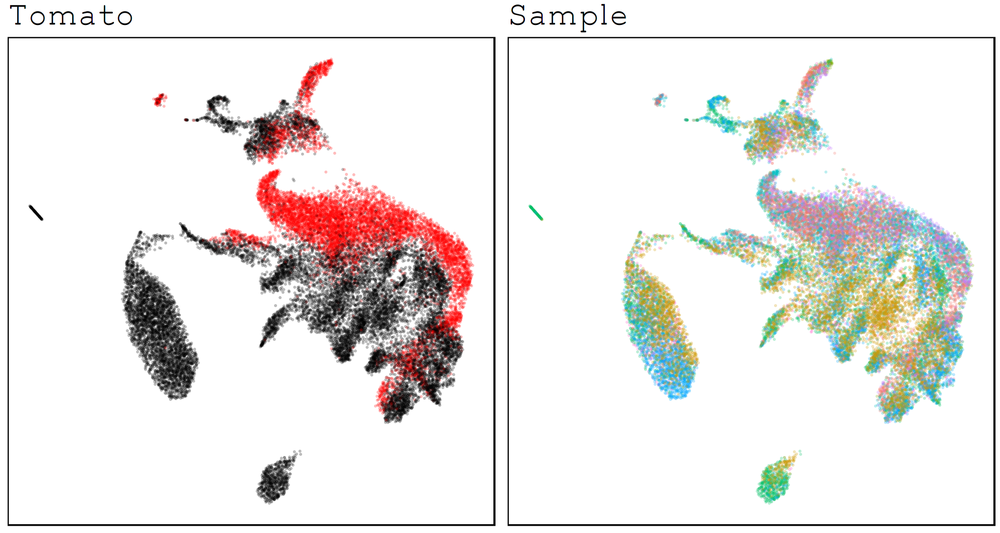

In [6]:
p1 = ggplot(umap, aes(umap_1, umap_2, col = meta$tdTom)) + 
        geom_point(alpha = 0.2, size = 0.5) + 
        labs(col = "Tomato") + 
        scale_colour_manual(values = c('positive' = 'red', 'negative' = 'black')) +
        ggtitle('Tomato') +
        umap_theme

p2 = ggplot(umap, aes(umap_1, umap_2, col = as.factor(meta$sample))) + 
        geom_point(alpha = 0.2, size = 0.5) + 
        ggtitle('Sample') +
        umap_theme

grid.arrange(p1, p2, ncol = 2)

In [8]:
#get order: oldest to youngest; most cells to least cells
order_df = meta[!duplicated(meta$sample), c("stage", "sample")]
order_df$ncells = sapply(order_df$sample, function(x) sum(meta$sample == x))
order_df$stage = factor(order_df$stage, 
                        levels = rev(c(
                                    "E8.5"
                                      )))
order_df = order_df[order(order_df$stage, order_df$ncells, decreasing = TRUE),]
order_df$stage = as.character(order_df$stage)

all_correct = doBatchCorrect(counts = logcounts(sce)[rownames(sce) %in% hvgs,], 
                             timepoints = meta$stage, 
                             samples = meta$sample, 
                             timepoint_order = order_df$stage, 
                             sample_order = order_df$sample, 
                             npc = 30)

In [9]:
nrow(all_correct)
nrow(meta)

[1] 27776

[1] 27776

In [10]:
# UMAP after batch correction
umap_corr = run_umap(all_correct)
# UMAP before batch correction
p1 = ggplot(umap_corr, aes(umap_1, umap_2, col = meta$tdTom)) + 
        geom_point(alpha = 0.2, size = 0.5) + 
        labs(col = "Tomato") + 
        scale_colour_manual(values = c('positive' = 'red', 'negative' = 'black')) +
        ggtitle('Tomato') +
        umap_theme

p2 = ggplot(umap_corr, aes(umap_1, umap_2, col = as.factor(meta$sample))) + 
        geom_point(alpha = 0.2, size = 0.5) + 
        ggtitle('Sample') +
        umap_theme

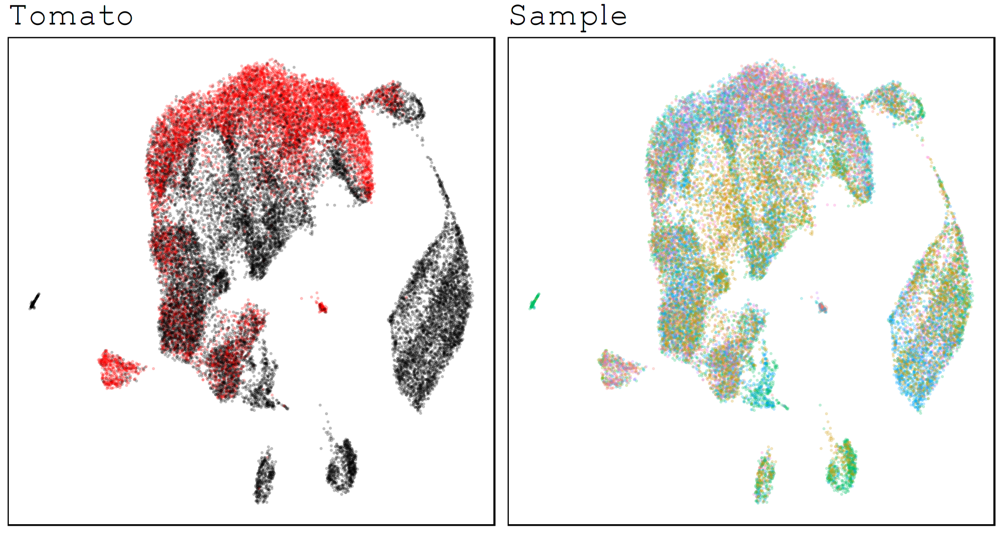

In [11]:
ggsave(paste0(out_dir, 'UMAPs_tomato_samples.png'), 
       grid.arrange(p1, p2, ncol = 2),
       device = 'png',
       width = 12,
       height = 5,
       dpi = 300)

In [12]:
# Save metadata & corrected PCs
meta = read.csv2(paste0(main, '05_doublet_detection/meta.tab'), sep='\t')
umap_corr$cell = row.names(umap_corr)
meta$index = seq(1:nrow(meta))
meta = merge(meta, umap_corr, by='cell', all=TRUE)
meta = meta[order(meta$index),]

In [13]:
# Add clusters to metadata
graph = buildSNNGraph(t(all_correct))
clusters = cluster_louvain(graph)
vec = as.numeric(membership(clusters))

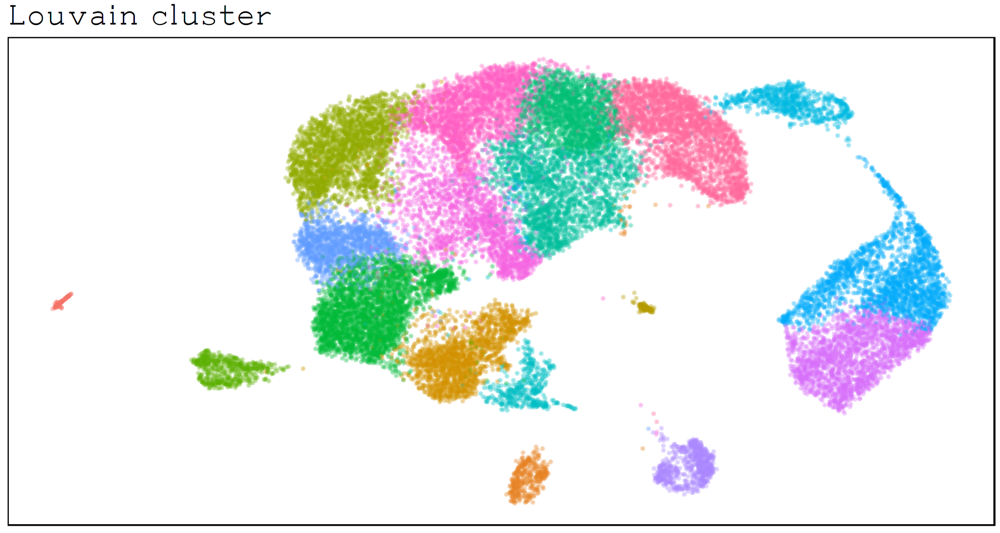

In [14]:
ggplot(umap_corr, aes(umap_1, umap_2, col = as.factor(vec))) + 
        geom_point(alpha = 0.2) + 
        geom_point(alpha = 0.2, size = 0.5) + 
        ggtitle('Louvain cluster') +
        umap_theme

In [15]:
cluster_df = data.frame('cell' = colnames(sce), 'louvain_cluster' = vec)
meta = merge(meta, cluster_df, by='cell', all=TRUE)
meta = meta[order(meta$index),]

In [16]:
WT = meta[meta$tdTom=='negative',]
KO = meta[meta$tdTom!='negative',]

Warning message:
“Use of `WT$louvain_cluster` is discouraged. Use `louvain_cluster` instead.”
Warning message:
“Removed 1939 rows containing missing values (geom_point).”
Warning message:
“Use of `KO$louvain_cluster` is discouraged. Use `louvain_cluster` instead.”
Warning message:
“Removed 456 rows containing missing values (geom_point).”


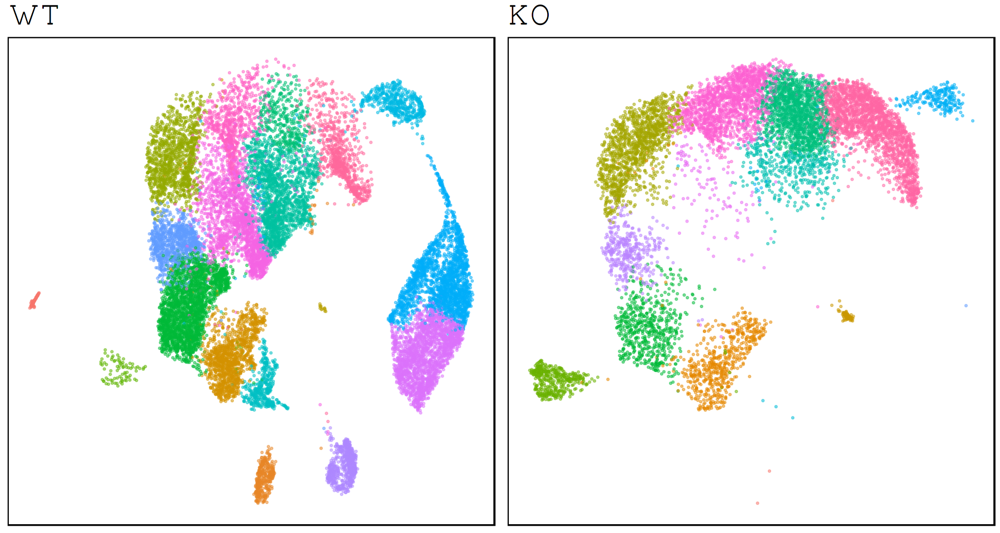

In [18]:
p1 = ggplot(WT, aes(umap_1, umap_2, col=as.factor(WT$louvain_cluster))) + 
geom_point(size = 0.7, alpha = 0.5) +
ggtitle(paste0('WT')) +
umap_theme
p2 = ggplot(KO, aes(umap_1, umap_2, col=as.factor(KO$louvain_cluster))) + 
geom_point(size = 0.7, alpha = 0.5) + 
ggtitle(paste0('KO')) +
umap_theme
grid.arrange(p1, p2, ncol=2)

In [19]:
write.table(meta, file = paste0(main, 'meta.tab'), sep = "\t", quote = FALSE, row.names = FALSE, col.names = TRUE)

write.csv(all_correct, file = paste0(out_dir, 'PCA_corrected.csv'), row.names = TRUE)

In [114]:
write.csv(all_correct, file = paste0(out_dir, 'PCA_corrected.csv'), row.names = TRUE)

In [20]:
meta$umap_1 = as.numeric(meta$umap_1)
meta$umap_2 = as.numeric(meta$umap_2)

In [21]:
meta = meta[match(colnames(sce), meta$cell),]

In [46]:
  decomp <- modelGeneVar(sce, block=meta$sample)
  decomp <- decomp[decomp$mean >  1e-3,]
    
  #exclude sex genes & tomato
  xist = "ENSMUSG00000086503"
  ychr = read.table("/rds/project/rds-SDzz0CATGms/users/bt392/software/ygenes.tab", stringsAsFactors = FALSE)[,1]
  other = c("tomato-td") #for the chimera
  decomp = decomp[!rownames(decomp) %in% c(xist, ychr, other),]  
    
  decomp$FDR <- p.adjust(decomp$p.value, method = "fdr")
decomp = decomp[order(decomp$FDR),]

In [100]:
plot_gene = function(x){

    p1 = ggplot(WT, aes(umap_1, umap_2, col=as.vector(logcounts(sce[x,cell])))) + 
        geom_point(size = 0.7, alpha = 0.5) + 
        scale_color_viridis(option='magma') + 
        ggtitle(paste0('log expression ', gene_map[gene_map[1]==x,2])) +
        umap_theme
    p2 = ggplot(KO, aes(umap_1, umap_2, col=as.vector(logcounts(sce[x,cell])))) + 
        geom_point(size = 0.7, alpha = 0.5) + 
        scale_color_viridis(option='magma') + 
        ggtitle(paste0('log expression ', gene_map[gene_map[1]==x,2])) +
        umap_theme
    grid.arrange(p1, p2, ncol=2)
}

In [68]:
db = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
gene_map = getBM(attributes = c("ensembl_gene_id", "external_gene_name"), filters = "ensembl_gene_id", values = genes[,1], mart = db)
gene_map = gene_map[order(match(gene_map$ensembl_gene_id, rownames(decomp))),]

In [99]:
head(gene_map)

,ensembl_gene_id,external_gene_name
,<chr>,<chr>
1577,ENSMUSG00000033227,Wnt6
598,ENSMUSG00000026234,Ncl
1152,ENSMUSG00000027239,Mdk
30,ENSMUSG00000001403,Ube2c
2464,ENSMUSG00000051159,Cited1
1502,ENSMUSG00000031326,Cdx4


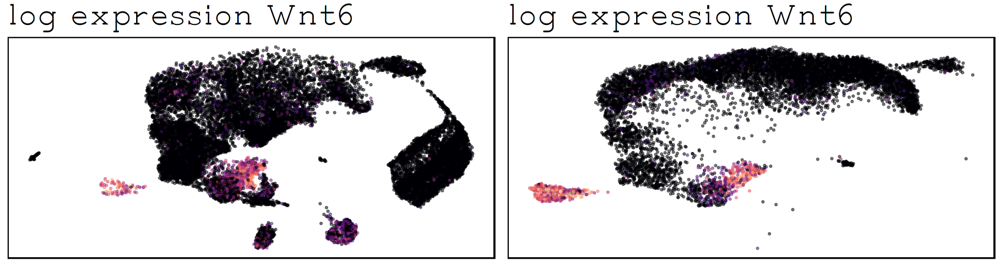

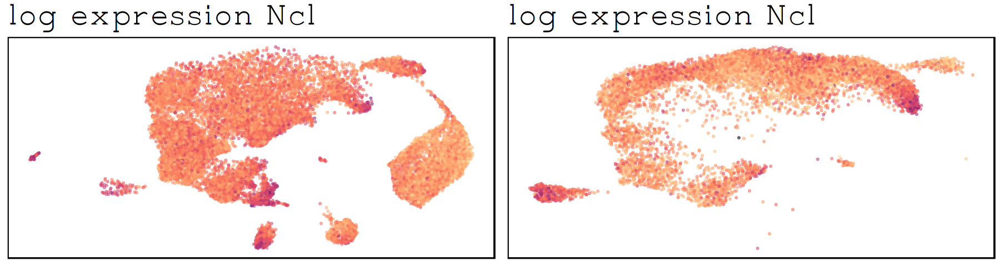

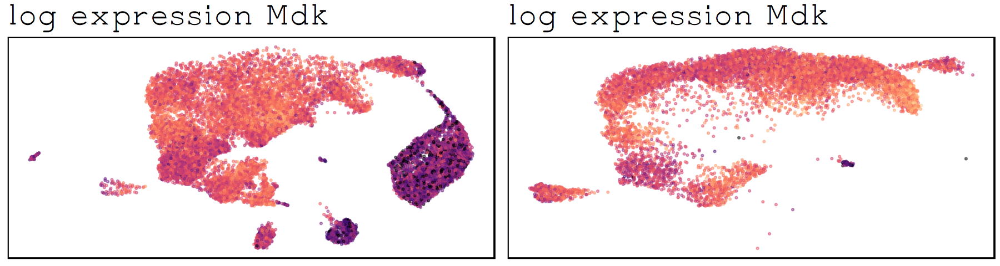

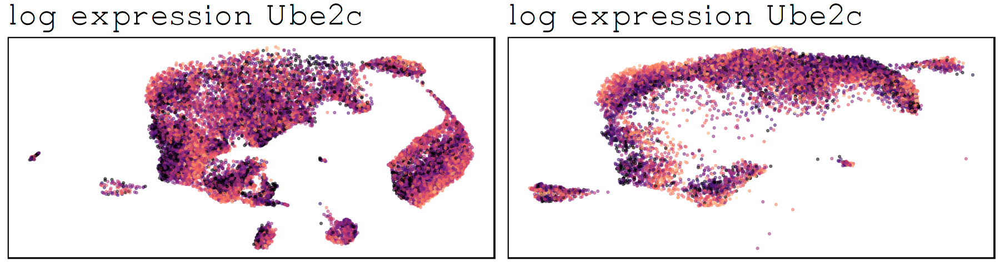

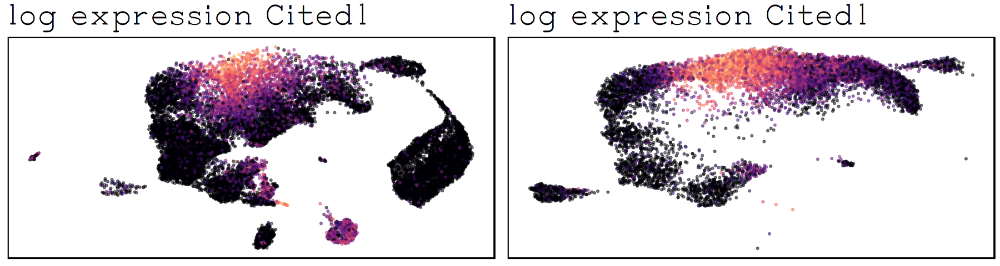

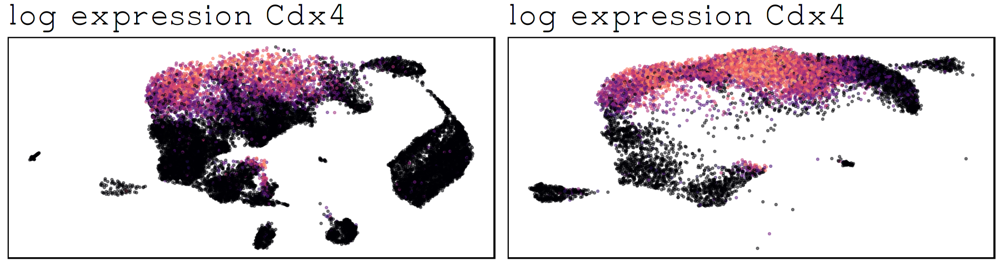

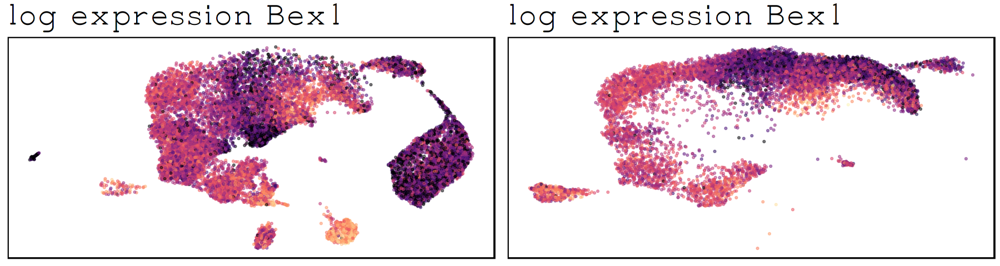

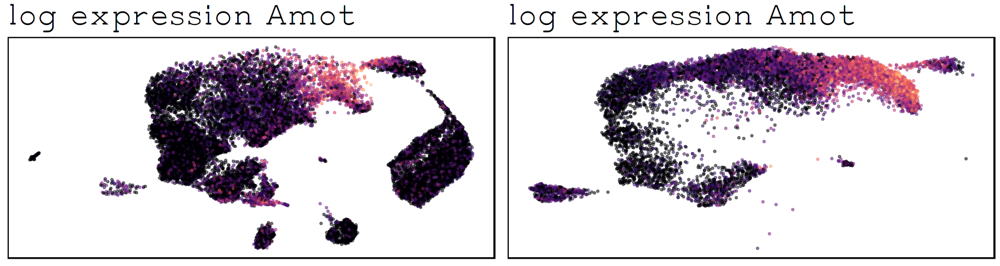

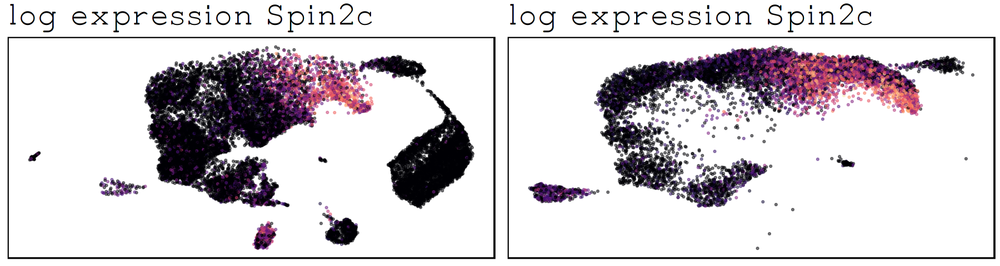

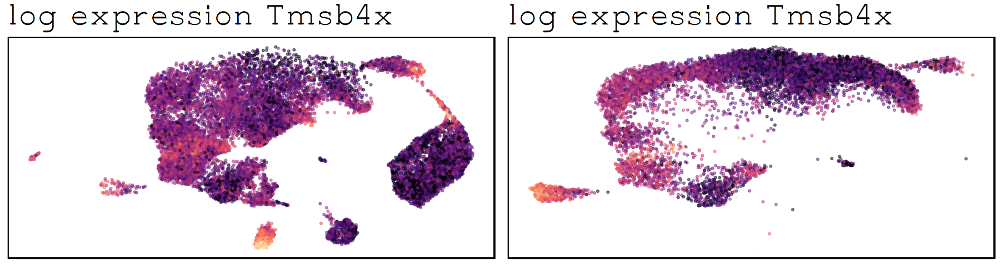

In [98]:
options(repr.plot.width=15, repr.plot.height=4)
for(i in 1:10){
    plot_gene(gene_map[i,1])
    }

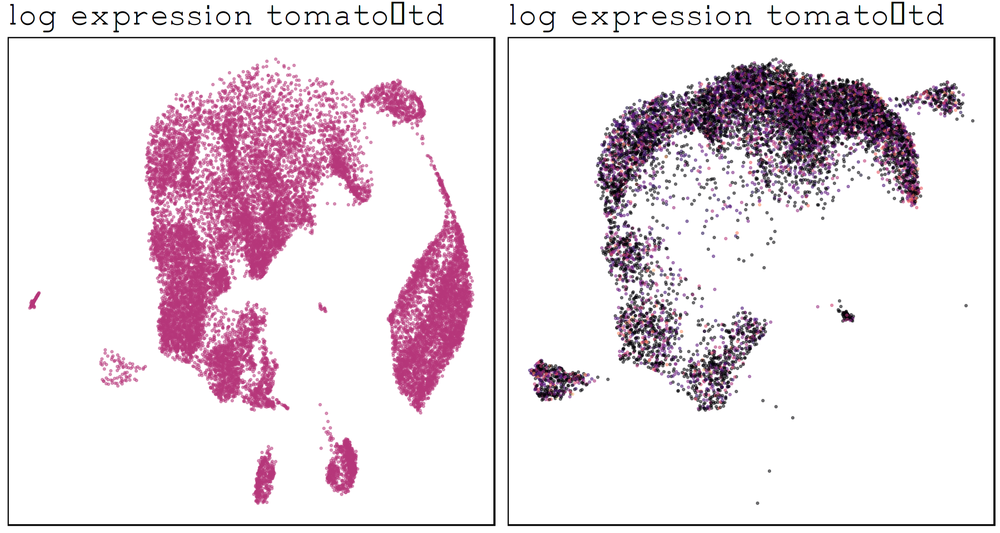

In [82]:
plot_gene(nrow(sce))

In [29]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Manjaro Linux

Matrix products: default
BLAS:   /usr/local/lib64/R/lib/libRblas.so
LAPACK: /usr/local/lib64/R/lib/libRlapack.so

locale:
 [1] LC_CTYPE=en_GB.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_GB.UTF-8        LC_COLLATE=en_GB.UTF-8    
 [5] LC_MONETARY=en_GB.UTF-8    LC_MESSAGES=en_GB.UTF-8   
 [7] LC_PAPER=en_GB.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_GB.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] cowplot_1.1.1               irlba_2.3.3                
 [3] batchelor_1.6.2             viridis_0.5.1              
 [5] viridisLite_0.4.0           gridExtra_2.3              
 [7] igraph_1.2.6                reticulate_1.18            
 [9] scran_1.18.1                